# Parte teórica

Classifique as afirmações em Verdadeiro ou Falso, justifique as afirmativas falsas

1 - A etapa de **quantização** em um processo de compressão de dados consiste em aumentar a aleatoriedade das informações.

**Falso:** A etapa de quantização em um processo de compressão de dados consiste em reduzir a precisão dos dados, ou seja, representar os valores com menos bits, o que pode levar à perda de informações. O objetivo é diminuir o tamanho do arquivo, mas isso não envolve aumentar a aleatoriedade das informações.

2 - Compresão do tipo fractal consiste em encontrar áreas similares ao redor de uma região de domínio.

**Verdadeiro:** A compresão do tipo fractal é baseada na ideia de que muitas partes de uma imagem podem ser representadas por outras partes da mesma imagem, ou seja, existem padrões auto-similares. Portanto, a afirmação é verdadeira, pois a compressão fractal envolve encontrar áreas similares dentro da imagem para representar essas áreas de forma mais eficiente.

3 - Histogramas de duas imagens distintas não serão nunca iguais

**Falso:** Histogramas de duas imagens distintas podem ser iguais se as imagens tiverem a mesma distribuição de intensidade de pixel, mesmo que as imagens sejam diferentes em termos de conteúdo visual. Portanto, a afirmação é falsa, pois é possível que duas imagens distintas tenham histogramas idênticos.

4 - O método RLE de compressão de dados sempre gera um resultado com menor quantidade de dados (comprimido).

**Falso:** O método RLE (Run-Length Encoding) é eficiente para comprimir dados que possuem longas sequências de valores repetidos, como imagens com grandes áreas de cor uniforme. No entanto, se os dados não tiverem muitas repetições, o RLE pode acabar gerando um resultado maior do que o original, pois ele precisa armazenar tanto o valor quanto a contagem de repetições. Portanto, a afirmação é falsa, pois o método RLE nem sempre gera um resultado com menor quantidade de dados.

5 - No contexto de áudios, frequência de amostragem é a frequência com que são captadas amostras do audio analógico para gerar um digital.

**Verdadeiro:** Frequência de amostragem é a frequência com que são captadas amostras do áudio analógico para gerar um digital. Portanto, a afirmação é verdadeira, pois a frequência de amostragem determina quantas vezes por segundo o áudio analógico é medido para criar uma representação digital do som.

# Parte prática

## Material de apoio

### Importações

```
import moviepy.editor as mpe
import numpy as np
import matplotlib.pyplot as plt
```

### Histograma
```
def histogram_gray(img):
    (l, c) = img.shape
    # Histograma com 1 linha e 256 colunas, preenchido com 0.
    histogram = np.zeros(256, dtype=np.int32)

    for i in range(l):
        for j in range(c):
            # Normalizar intensidade do pixel 
            intensity = img[i, j]
            # Incrementar de 1 a quantidade de pixels no histograma,
            # utilizando a intensidade como índice.
            histogram[intensity] += 1
            
    return histogram

def show_histogram(img):
    histogram_r = histogram_gray(img[:, :, 0])
    histogram_g = histogram_gray(img[:, :, 1])
    histogram_b = histogram_gray(img[:, :, 2])
    
    plt.figure(figsize=(16, 16))
    plt.subplot(2, 1, 1)
    plt.bar(range(256), histogram_r, color='red')
    plt.bar(range(256), histogram_g, color='green')
    plt.bar(range(256), histogram_b, color='blue')

```

### Manipulação de imagens

```
(l,c,p) = img.shape
plt.imshow(imagem)
```

### Forçando uma imagem de uma página para 3 páginas
```
  imagem_3p = np.zeros(shape=(l,c,p),dtype=np.uint8)
  imagem_3p[:,:, 0] = frame_1p
  imagem_3p[:,:, 1] = frame_1p
  imagem_3p[:,:, 2] = frame_1p
```

### Detecção de bordas
```
    imagem_grey = np.average(frame, axis=2).astype(np.float64)
   
    abs_tg_c = np.abs(np.diff(imagem_grey.astype(np.float64), axis=0, append=255))
    abs_tg_l = np.abs(np.diff(imagem_grey.astype(np.float64), axis=1, append=255))
    abs_tg = np.sqrt(abs_tg_c ** 2 + abs_tg_l ** 2)

    imagem_border = np.zeros(shape=(l, c), dtype=np.uint8)
    imagem_border[abs_tg > threshold] = 255
```

### Manipulação de vídeo
```
video = mpe.VideoFileClip("video.mp4")
frame = video.get_frame(2 / video.fps)
frame = video.get_frame(2)
video.ipython_display(width=480)
video_modificado = video.fl_image(func_modificar)
subclip = video.subclip(0,2)
subclip = video.subclip(3)
parts = mpe.concatenate_videoclips([part1, part])
video.write_videofile('video.mp4')
```

### Imagem binária
```
 image_bw = np.average(frame, axis=2).astype(np.float64)
 image_bin = np.zeros(shape=(l,c),dtype=np.uint8)
 image_bin[image_bw > thresh] = 255
```

### Reflexão

#### Numpy (recomendado)
```
    img_refl = np.zeros(shape=imagem.shape, dtype=np.uint8)
    img_refl[::1, ::-1] = imagem
```

#### Iterativo (mais lento)
```
img_refl = np.zeros(shape=img.shape, dtype=np.uint8)
for i in range(l):
    for j in range(c):
        new_x = -j
        new_y = i
        img_refl[new_y, new_x] = img[i, j]
```


**1 -** Importe as bibliotecas que serão usadas

In [1]:
# OBSERVAÇÕES VERSÃO PYTHON E MOVIEPY
# Instalação versão com problema:
# !pip install moviepy==1.0.3
# import moviepy.editor as mpe

# tive que usar a importação nas células seguintes direta, pq o moviepy.editor não existe no moviepy 2.x, 
# Tentei dar pip install no moviepy 1.0.3 que é recomendado no stackoverflow, mas ainda assim o import do moviepy.editor dá erro
# tentei corrigir o erro do concatenate, dei pip install em decorator 4.3.0, 4.4.0, depois pillow<10 e nada funcionou,
# Por isso vou importar direto as funções usadas executando nesse ambiente com moviepy 2.2.1
# O problema da compatbilidade vêm do python 3.11+ ser incompatível com o moviepy 1.0.3, só 2.x em diante

# Abaixo vou listar as funções utilizadas da 2.x que possuem a mesma utilidade das funções da 1.0.3
# .imageTransform() -> fl_image()
# display_in_notebook() -> ipython_display()
# .subclipped() -> .sublicp()
# .concatenate_videoclips() -> se mantem igual
# videoFileClip() -> igual mas sem necessidade de mpe.
# .writeVideoFile() -> se mantem igual
# getFrame() - > se manteve igual


In [2]:
!pip install moviepy==2.2.1

In [3]:
from moviepy import VideoFileClip, AudioFileClip, CompositeVideoClip
from moviepy import concatenate_videoclips
import numpy as np
import matplotlib.pyplot as plt

**2 -** Abra o vídeo "boydancing.mp4" e salve-o em uma variável, pegue o **frame do segundo 3** e o exiba.

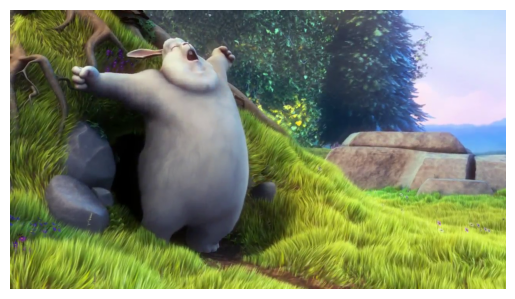

In [4]:
video = VideoFileClip("bigbuckbunny.mp4")
frame = video.get_frame(3)

# exibindo o frame
plt.axis('off')
plt.imshow(frame)

**3 -** Aplique detecção de bordas do frame selecionado com treshold de 3 e exiba.

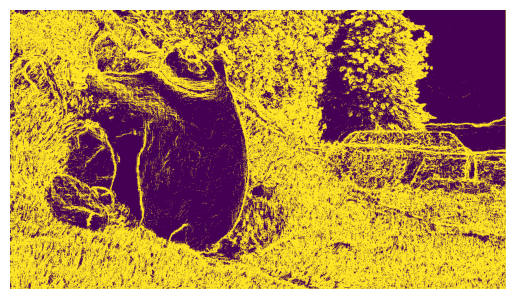

In [5]:
threshold = 3
l,c,p = frame.shape

imagem_grey = np.average(frame, axis=2).astype(np.float64)
   
abs_tg_c = np.abs(np.diff(imagem_grey.astype(np.float64), axis=0, append=255))
abs_tg_l = np.abs(np.diff(imagem_grey.astype(np.float64), axis=1, append=255))
abs_tg = np.sqrt(abs_tg_c ** 2 + abs_tg_l ** 2)

imagem_border = np.zeros(shape=(l, c), dtype=np.uint8)
imagem_border[abs_tg > threshold] = 255

plt.axis('off')
plt.imshow(imagem_border)

**4 -** Crie uma função que receba um frame e retorne um frame em imagem binário com **treshold de 130**, aplique essa função no vídeo e observe o resultado. **Sua função deve retornar um frame com 3 páginas para evitar problemas**.

(720, 1280, 3)


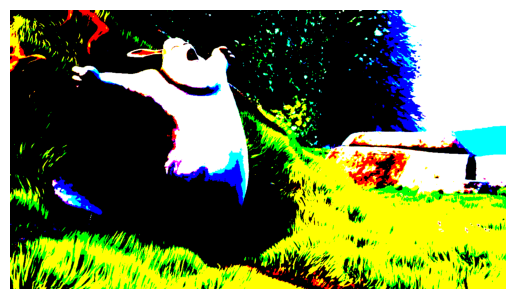

In [6]:
def binary_threshold(image):
    threshold = 130
    binary_image = np.zeros_like(image)
    binary_image[image > threshold] = 255
    return binary_image

# aplicando função no vídeo (precisei usar a função image transform, que é equivalente ao fl_image só que na versão 2.x)
video_binary = video.image_transform(binary_threshold)

frame_teste = video.get_frame(3)
resultado = binary_threshold(frame_teste)
print(resultado.shape)

plt.axis('off')
plt.imshow(resultado)

**5 -** Separe o vídeo original em 2 subclips:
- Segundos 0 ao 2: Aplicar conversão para binário
- Segundos 2 em diante: Mantenha o video original

**Una esses clips em um único vídeo e exiba o resultado.**

In [7]:
# Observações de erro por conta da versão: subclipped é o subclip da versão 2.x 
# E display é a versão 2.x para o ipython display

clip1 = video.subclipped(0, 2)
clip1 = clip1.image_transform(binary_threshold)
clip2 = video.subclipped(2, video.duration)

video_concatenado = concatenate_videoclips([clip1, clip2])

# Exibindo o vídeo concatenado
video_concatenado.display_in_notebook()

MoviePy - Building video __temp__.mp4.
MoviePy - Writing audio in __temp__TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
MoviePy - Writing video __temp__.mp4



MoviePy - Done !
MoviePy - video ready __temp__.mp4


**6 -** Gere um arquivo de áudio contendo uma senoide de 500Hz com duração de 3 segundos, em seguida toque-a.

In [8]:
duracao = 3
frequencia = 500
sample_rate = 44100

t = np.linspace(0, duracao, int(sample_rate * duracao), endpoint=False)
senoide = np.sin(2 * np.pi * frequencia * t)

# tocando o áudio
from IPython.display import Audio # todo: lembrar de jogar isso la pra cima e re rodar tudo
Audio(senoide, rate=sample_rate)


**7 -** Manipule o áudio da questão anterior de modo que ele fique mais grave.

In [9]:
# deixando o audio mais grave
frequencia_grave = 300
senoide_grave = np.sin(2 * np.pi * frequencia_grave * t) # 2pi.f ou 2pi/T (periodo T)
Audio(senoide_grave, rate=sample_rate)

**8 -** Salve o vídeo resultante da questão 5 como "resultado_video.mp4" e o áudio resultante da questão 7 como "resultado_audio

In [10]:
# video questão 5
video_concatenado.write_videofile("resultado_video.mp4")

# audio questão 7
from scipy.io.wavfile import write
write("resultado_audio.wav", sample_rate, senoide_grave.astype(np.float32))

MoviePy - Building video resultado_video.mp4.
MoviePy - Writing audio in resultado_videoTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
MoviePy - Writing video resultado_video.mp4



MoviePy - Done !
MoviePy - video ready resultado_video.mp4
